# Whiteshark PV Analysis

In this notebook we calculate the PV content, and look at the annual cycle in PV in the mode water layer (both graphically and through integrated budgets).


In [9]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.patches import ConnectionPatch
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
import matplotlib.colors as colors
import numpy as np
import xarray as xr
import os
import sys
#import cv2
#import matplotlib.patches as patches
#from mpl_toolkits.basemap import Basemap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy as cartopy
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
#import cmocean as cmo

#import 
from netCDF4 import Dataset
from scipy.io import loadmat
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

sys.path.append('/home/jacob13/PYROMSEDIT/')


######################
#some ROMS tools examples 
######################

sys.path.append("/home/jacob13/CROCO-NH/Modules/") 
import R_tools as tools
import R_tools_fort as toolsF

###################################################################################
# Use fortran order for arrays
####################################################################################

def Forder(var):
   return np.asfortranarray(var.T,dtype=np.float64)

####################################################################################


#from grid_MOD import get_ROMS_grid_MOD
plt.rcParams['text.usetex'] = True
plt.rcParams.update({'font.size': 22})
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'

plt.rcParams['text.usetex'] = True
plt.rcParams.update({'font.size': 22})
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'


In [4]:
csal = loadmat('/home/jacob13/colormap_salinity.mat')
cmapS = csal['cmapS']
cmapS.shape
smap = colors.LinearSegmentedColormap.from_list('SalMap',cmapS, N=204)
smap

# Balance defined at very bottom of this notebook (hack to avoid importing cmocean on the cluster)
bmap = colors.LinearSegmentedColormap.from_list('Balance', balance, N=balance.size)

In [10]:
# Load MSHARK grid file
file = '/data/thomas/jacob13/WHITESHARKCAFE/MSHARK/mshark_grd.nc'
msharkgrid = xr.open_dataset(file)

# Load files (concatenate across all files)
filelocation = '/data/thomas/jacob13/WHITESHARKCAFE/MSHARK/'
dsmshark= xr.open_mfdataset(filelocation+'mshark_his*.nc', concat_dim='time', data_vars='minimal', compat='equals')
#dsmshark = xr.open_dataset(filelocation+'mshark_his.0000.nc')
msharkyearday = np.mod(dsmshark.scrum_time/86400, 360)


# Calculate z level
hc = dsmshark.hc
Cs_r = Forder(dsmshark.Cs_r)
Cs_w = Forder(dsmshark.Cs_w)

topo = Forder(msharkgrid.h.values)
zeta = Forder(dsmshark.zeta.values[0,:,:])

(z_r,z_w) = toolsF.zlevs(topo, zeta[:,:], hc, Cs_r, Cs_w)

/usr/local/anaconda3/envs/lagranto/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: In xarray version 0.13 `auto_combine` will be deprecated.
  coords=coords)
/usr/local/anaconda3/envs/lagranto/lib/python3.7/site-packages/xarray/backends/api.py:783: FutureWarning: Also `open_mfdataset` will no longer accept a `concat_dim` argument.
To get equivalent behaviour from now on please use the new
`combine_nested` function instead (or the `combine='nested'` option to
`open_mfdataset`).The datasets supplied have global dimension coordinates. You may want
to use the new `combine_by_coords` function (or the
`combine='by_coords'` option to `open_mfdataset` to order the datasets
before concatenation. Alternatively, to continue concatenating based
on the order the datasets are supplied in in future, please use the
new `combine_nested` function (or the `combine='nested'` option to
open_mfdataset).
  coords=coords)


In [31]:
ts = np.argmin(np.abs(msharkyearday.values-(4.625*30)))

tempf = Forder(dsmshark.temp[ts,:,:,:].values)
saltf = Forder(dsmshark.salt[ts,:,:,:].values)
uf    = Forder(dsmshark.u[ts,:,:,:])
vf    = Forder(dsmshark.v[ts,:,:,:])

dbdx, dbdy, dbdz =  tools.rho_grad_buoy_sig(tempf,saltf,z_r,z_w,1024,9.8,msharkgrid.pm.values,msharkgrid.pn.values,simul=None)
pPV = (dbdz.T*msharkgrid.f.values).T
pPV = tools.rho2psi(pPV)

ZETA = tools.get_vrt(uf, vf, z_r, z_w, msharkgrid.pm.values,msharkgrid.pn.values)
PV = tools.PV(tempf,saltf,uf,vf,z_r,z_w,msharkgrid.f.values,9.8,1024,msharkgrid.pm.values,msharkgrid.pn.values,mask=None,simul=None)

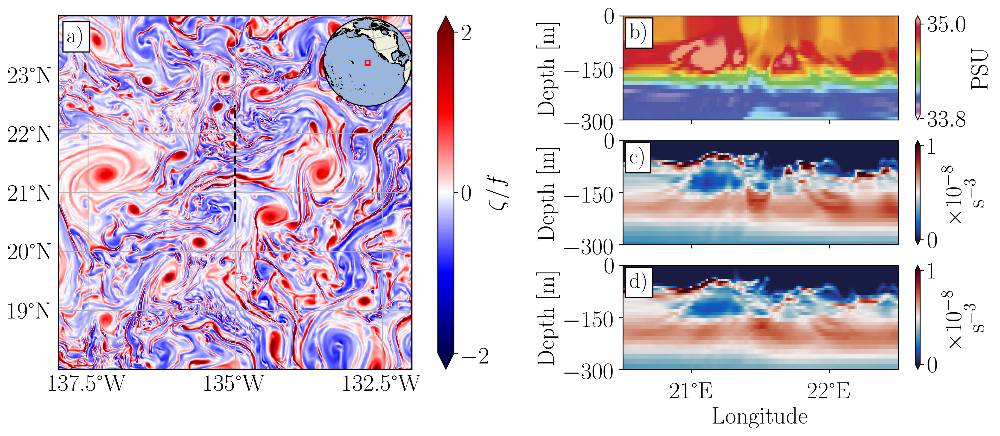

In [34]:
# ZETA, SALT, PV, and pPV plot
#ei=np.argmin(np.abs(msharkgrid.lat_psi.values[:,100] - 19.55))
#ei=np.argmin(np.abs(msharkgrid.lat_psi.values[:,100] - 22.5))
xi=np.argmin(np.abs(msharkgrid.lon_psi.values[100,:] +135.25))
xi=np.argmin(np.abs(msharkgrid.lon_psi.values[100,:] +135.))

# 1) Pick a time in April
# 2) Add an upper plot showing surface vorticity and section line
# 3) Hunt for correct position/time.

pvllim = 0
pvhlim = 1.

#Define Figure
fig = plt.figure(figsize=(16,6), dpi=300)
gs = gridspec.GridSpec(3,2, figure=fig, width_ratios=[1.5,1])
axz = plt.subplot(gs[:, 0], projection=ccrs.PlateCarree())
axq = plt.subplot(gs[1, 1])
axf = plt.subplot(gs[2, 1])
axs = plt.subplot(gs[0, 1])

# zeta plot
im = axz.pcolormesh(msharkgrid.lon_rho.values, msharkgrid.lat_rho.values, ZETA[:,:,-1]/tools.rho2psi_2d(msharkgrid.f.values), 
                    vmin=-2, vmax=2, cmap='seismic')
#plt.colorbar(im, ax=axz)
#axz.axhline(msharkgrid.lat_psi.values[ei,0])
#axz.axvline(msharkgrid.lon_psi.values[0,xi])
gl = axz.gridlines(draw_labels=True)

gl.xlabels_top = False
gl.ylabels_right = False
gl.xlocator = mticker.FixedLocator([-145, -142.5, -140, -137.5, -135, -132.5, -130,-127.5, -125])
axz.set_xticklabels(['','','-140', '','-135','','-130','',''])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
axz.add_feature(cfeature.OCEAN, facecolor='1')
zlatl = 19.5
zlatr = 25.5
zlatl = 18
zlatr = 24
zlonl = -138.
zlonr = -132.
axz.set_xlim(zlonl, zlonr)
axz.set_ylim(zlatl, zlatr)

axz.text( zlonl+0.15, zlatr-0.45 ,'a)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

##fig.subplots_adjust(right=0.95)
#cbar_ax = fig.add_axes([0.8, 0.35, 0.02, 0.5])
cb = plt.colorbar(im, ax=axz, extend='both', ticks=[-2, 0, 2])
#cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[-2, 0, 2])
cb.set_label('$\zeta /f$', labelpad=-5)

#SALT plot
xi = 450
xl = 20.5
xr = 22.5

slow = 33.75
shigh = 35.25
slow = 33.8444
shigh = 35.0410
#im = axs.pcolormesh(msharkgrid.lon_rho.values[ei,:], z_w[ei,1,:],np.transpose(saltf[ei,:,:]*1e8),  cmap='inferno')
im = axs.pcolormesh(msharkgrid.lat_rho.values[:,xi], z_w[1,xi,:],np.transpose( saltf[:,xi,:]), vmin=slow, vmax=shigh, cmap=smap)

axs.set_ylim(-300,0)
axs.set_yticks([-300, -150, 0])
axs.set_ylabel('Depth [m]')
axs.xaxis.set_major_formatter(LATITUDE_FORMATTER)
axs.set_xticklabels([])
axs.text( xl+0.05, -65 ,'b)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

cb = plt.colorbar(im, ax=axs, extend='both', ticks = [round(slow,1), round(shigh,1)])
cb.set_label('PSU')

#axq.axvline(msharkgrid.lon_psi.values[ei,xi])
#xl = -137.5
#xr = -134
#xl = -137
#xr = -133
axs.set_xlim(xl, xr)


#pv plot

#im = axq.pcolormesh(msharkgrid.lon_psi.values[ei,:], z_w[ei,1,:],np.transpose( PV[ei,:,:]*1e8), vmin=pvllim, vmax=pvhlim, cmap='inferno')
im = axq.pcolormesh(msharkgrid.lat_psi.values[:,xi], z_w[1,xi,:],np.transpose( PV[:,xi,:]*1e8), vmin=pvllim, vmax=pvhlim, cmap=bmap)
axq.set_ylim(-300,0)
axq.set_yticks([-300, -150, 0])
axq.set_ylabel('Depth [m]')
axq.xaxis.set_major_formatter(LATITUDE_FORMATTER)
axq.set_xticklabels([])
axq.set_xlim(xl, xr)
axq.text( xl+0.05, -65 ,'c)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

cb = plt.colorbar(im, ax=axq, extend='both', ticks = [pvllim, pvhlim])
cb.set_label('$\\times 10^{-8}$\n s$^{-3}$')

#xli = np.argmin(np.abs(msharkgrid.lon_psi.values[ei,:] - xl))
#xri = np.argmin(np.abs(msharkgrid.lon_psi.values[ei,:] - xr))
#axz.plot(msharkgrid.lon_psi[ei,xli:xri], msharkgrid.lat_psi[ei,xli:xri], color='k', linestyle='--', linewidth=2)
xli = np.argmin(np.abs(msharkgrid.lat_psi.values[:,xi] - xl))
xri = np.argmin(np.abs(msharkgrid.lat_psi.values[:,xi] - xr))
axz.plot(msharkgrid.lon_psi[xli:xri, xi], msharkgrid.lat_psi[xli:xri, xi], color='k', linestyle='--', linewidth=2)


#planetary pv plot
#im = axf.pcolormesh(msharkgrid.lon_psi.values[ei,:], z_r[ei,1,:],np.transpose( pPV[ei,:,:]*1e8), vmin=pvllim, vmax=pvhlim, cmap='inferno')
im = axf.pcolormesh(msharkgrid.lat_psi.values[:,xi], z_r[1,xi,:],np.transpose( pPV[:,xi,:]*1e8), vmin=pvllim, vmax=pvhlim, cmap=bmap)

axf.set_ylim(-300,0)
axf.set_yticks([-300, -150, 0])
#axf.set_yticklabels([])
axf.set_ylabel('Depth [m]')

#axf.axvline(msharkgrid.lon_psi.values[ei,xi])
axf.text( xl+0.05, -65 ,'d)', color='k', size=20, bbox=dict(facecolor='w', edgecolor='k') )

axf.set_xlim(xl, xr)
axf.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
axf.set_xlabel('Longitude')
axf.tick_params(axis='x', which='major', pad=8)
cb = plt.colorbar(im, ax=axf, extend='both', ticks = [pvllim, pvhlim])
cb.set_label('$\\times 10^{-8}$\n s$^{-3}$')

#cbar_ax = fig.add_axes([0.95, 0.12, 0.015, 0.14])
#cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[pvllim, pvhlim])
#cb.set_label('$\\times 10^{-8}$\n s$^{-3}$')
##pv plot slice lat
#im = axf.pcolormesh(msharkgrid.lat_psi.values[:,xi], z_w[1,xi,:],np.transpose( PV[:,xi,:]), vmin=pvllim, vmax=pvhlim)
#axf.set_ylim(-500,0)

#axf.axvline(msharkgrid.lat_psi.values[ei,xi])

#planetary pv plot
#axf.pcolormesh(msharkgrid.lon_psi.values[ei,:], z_r[ei,1,:],np.transpose( pPV[ei,:,:]), vmin=pvllim, vmax=pvhlim)
#axf.set_ylim(-500,0)
#plt.colorbar(im, ax=axf)


# ADD MAP TO ZETA PLOT
ax = inset_axes(axz, width="25%", height="26%", loc=1, borderpad=0.01, axes_class=cartopy.mpl.geoaxes.GeoAxes,
                    axes_kwargs={'facecolor':'lightgrey', 'map_projection':ccrs.Orthographic(-135, 22)})

#ax = fig.add_subplot(cbaxes, subplot_kw={'projection': ccrs.PlateCarree()})

#ax.pcolormesh(longrid, latgrid, np.transpose(sst), cmap=cmap, vmin = tliml, vmax=tlimh, transform = ccrs.PlateCarree())

ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor='black')
#
ax.set_global()
ax.gridlines()



tf = ccrs.Geodetic()
indl = np.argmin(np.abs(msharkgrid.lon_rho.values[-1,:]-zlonl))
indr = np.argmin(np.abs(msharkgrid.lon_rho.values[-1,:]-zlonr))
indb = np.argmin(np.abs(msharkgrid.lat_rho.values[:,indl] - zlatl))
indt = np.argmin(np.abs(msharkgrid.lat_rho.values[:,indl] - zlatr))
ax.plot(msharkgrid.lon_rho[indt,indl:indr], msharkgrid.lat_rho[indt,indl:indr],
         color='r', linestyle='-',
         transform=tf,
         ) # TOP

ax.plot(msharkgrid.lon_rho[indb,indl:indr], msharkgrid.lat_rho[indb,indl:indr],
         color='r', linestyle='-',
         transform=tf,
         ) # BOTTOM

ax.plot(msharkgrid.lon_rho[indb:indt,indl], msharkgrid.lat_rho[indb:indt,indl],
         color='r', linestyle='-',
         transform=tf,
         ) # LEFT

ax.plot(msharkgrid.lon_rho[indb:indt,indr], msharkgrid.lat_rho[indb:indt,indr],
         color='r', linestyle='-',
         transform=tf,
         ) # RIGHT

axz.plot(msharkgrid.lon_rho[-1,:], msharkgrid.lat_rho[-1,:],
         color='k', linestyle='-',
         transform=tf,
         ) # TOP

axz.plot(msharkgrid.lon_rho[0,:], msharkgrid.lat_rho[0,:],
         color='k', linestyle='-',
         transform=tf,
         ) # BOTTOM

axz.plot(msharkgrid.lon_rho[:,0], msharkgrid.lat_rho[:,0],
         color='k', linestyle='-',
         transform=tf,
         ) # LEFT

axz.plot(msharkgrid.lon_rho[:,-1], msharkgrid.lat_rho[:,-1],
         color='k', linestyle='-',
         transform=tf,
         ) # RIGHT

# Draw Connections
xm = int(0.5*(xli+xri))
#con = ConnectionPatch(xyA=[msharkgrid.lon_psi[ei,xm], msharkgrid.lat_psi[ei,xm]], xyB=[-135, 0], coordsA="data", coordsB="data",
#                      axesA=axz, axesB=axq, color='k')
#axz.add_artist(con)

plt.subplots_adjust(wspace=0.25)
#plt.savefig('ModeWaterEddy_wSalt.jpg', bbox_inches='tight')

In [ ]:
msharkyearday.values.size

FileNotFoundError: Failed to find a Ghostscript installation

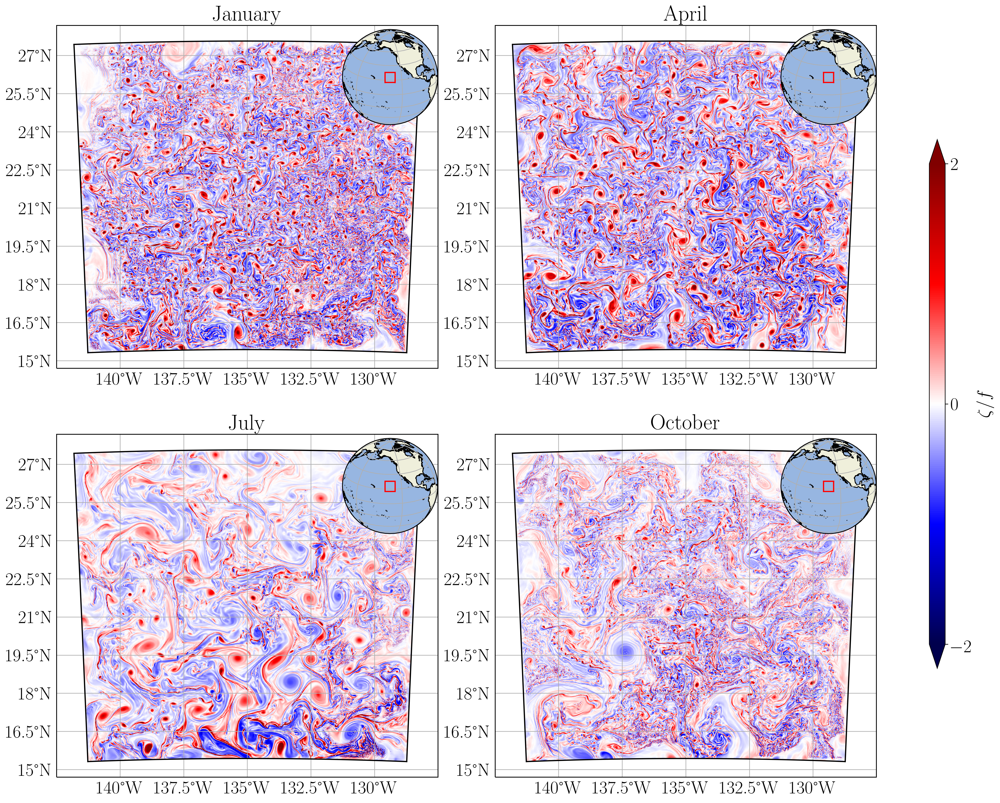

In [40]:
# ZETA 4 Panel
ei=np.argmin(np.abs(msharkgrid.lat_psi.values[:,100] - 19.55))
xi=np.argmin(np.abs(msharkgrid.lon_psi.values[100,:] +135.25))

# 1) Pick a time in April
# 2) Add an upper plot showing surface vorticity and section line
# 3) Hunt for correct position/time.

pvllim = 0
pvhlim = 1.5

#Define Figure
fig = plt.figure(figsize=(18,18), dpi=300)
gs = gridspec.GridSpec(2,2, figure=fig, height_ratios=[1,1])

toff = 0
month = [1, 4, 7, 10]
titles = ['January', 'April', 'July', 'October']
for i in range(0,4):
    ts = np.argmin(np.abs(msharkyearday.values[toff:]-((month[i]-1)+0.5)*30)) + toff
    uf    = Forder(dsmshark.u[ts,-3:,:,:])
    vf    = Forder(dsmshark.v[ts,-3:,:,:])
    ZETA = tools.get_vrt(uf, vf, z_r[:,:,-3:], z_w[:,:,-4:], msharkgrid.pm.values,msharkgrid.pn.values)

    axz = plt.subplot(gs[i], projection=ccrs.PlateCarree())


    # zeta plot
    im = axz.pcolormesh(msharkgrid.lon_rho.values, msharkgrid.lat_rho.values, ZETA[:,:,-1]/tools.rho2psi_2d(msharkgrid.f.values), vmin=-2, vmax=2, cmap='seismic')
    #plt.colorbar(im, ax=axz)
    #axz.axhline(msharkgrid.lat_psi.values[ei,0])
    #axz.axvline(msharkgrid.lon_psi.values[0,xi])
    gl = axz.gridlines(draw_labels=True)

    gl.xlabels_top = False
    gl.ylabels_right = False
    gl.xlocator = mticker.FixedLocator([-145, -142.5, -140, -137.5, -135, -132.5, -130,-127.5, -125])
    axz.set_xticklabels(['','','-140', '','-135','','-130','',''])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    axz.add_feature(cfeature.OCEAN, facecolor='1')
    axz.set_title(titles[i])
    #fig.subplots_adjust(right=0.95)
    #cbar_ax = fig.add_axes([0.8, 0.35, 0.02, 0.5])
    #cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[-2, 0, 2])
    #cb.set_label('$\zeta /f$')


    # ADD MAP TO ZETA PLOT
    ax = inset_axes(axz, width="25%", height="30%", loc=1, borderpad=0.01, axes_class=cartopy.mpl.geoaxes.GeoAxes,
                    axes_kwargs={'facecolor':'lightgrey', 'map_projection':ccrs.Orthographic(-135, 22)})

    #ax = fig.add_subplot(cbaxes, subplot_kw={'projection': ccrs.PlateCarree()})

    #ax.pcolormesh(longrid, latgrid, np.transpose(sst), cmap=cmap, vmin = tliml, vmax=tlimh, transform = ccrs.PlateCarree())

    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor='black')
#
    ax.set_global()
    ax.gridlines()



    tf = ccrs.Geodetic()
    ax.plot(msharkgrid.lon_rho[-1,:], msharkgrid.lat_rho[-1,:],
             color='r', linestyle='-',
             transform=tf,
             ) # TOP

    ax.plot(msharkgrid.lon_rho[0,:], msharkgrid.lat_rho[0,:],
             color='r', linestyle='-',
             transform=tf,
             ) # BOTTOM

    ax.plot(msharkgrid.lon_rho[:,0], msharkgrid.lat_rho[:,0],
             color='r', linestyle='-',
             transform=tf,
             ) # LEFT

    ax.plot(msharkgrid.lon_rho[:,-1], msharkgrid.lat_rho[:,-1],
             color='r', linestyle='-',
             transform=tf,
             ) # RIGHT

    axz.plot(msharkgrid.lon_rho[-1,:], msharkgrid.lat_rho[-1,:],
             color='k', linestyle='-',
             transform=tf,
             ) # TOP

    axz.plot(msharkgrid.lon_rho[0,:], msharkgrid.lat_rho[0,:],
             color='k', linestyle='-',
             transform=tf,
             ) # BOTTOM

    axz.plot(msharkgrid.lon_rho[:,0], msharkgrid.lat_rho[:,0],
             color='k', linestyle='-',
             transform=tf,
             ) # LEFT

    axz.plot(msharkgrid.lon_rho[:,-1], msharkgrid.lat_rho[:,-1],
             color='k', linestyle='-',
             transform=tf,
             ) # RIGHT

    
cbar_ax = fig.add_axes([0.95, 0.25, 0.015, 0.5])
cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[-2, 0, 2])
cb.set_label(r'$\zeta/f$')
plt.subplots_adjust(wspace=0.15, hspace=0.05)
#plt.savefig('AnnualZeta.ps', bbox_inches='tight')

In [ ]:
uf.shape

In [ ]:
# ZETA, PV, and pPV plot
ei=np.argmin(np.abs(msharkgrid.lat_psi.values[:,100] - 19.55))
xi=np.argmin(np.abs(msharkgrid.lon_psi.values[100,:] +135.25))

# 1) Pick a time in April
# 2) Add an upper plot showing surface vorticity and section line
# 3) Hunt for correct position/time.

pvllim = 0
pvhlim = 1.5

#Define Figure
fig = plt.figure(figsize=(12,10))
gs = gridspec.GridSpec(2,2, figure=fig, height_ratios=[4,1])
axz = plt.subplot(gs[0, :], projection=ccrs.PlateCarree())
axq = plt.subplot(gs[1, 0])
axf = plt.subplot(gs[1, 1])

# zeta plot
im = axz.pcolormesh(msharkgrid.lon_rho.values, msharkgrid.lat_rho.values, ZETA[:,:,-1]/tools.rho2psi_2d(msharkgrid.f.values), vmin=-2, vmax=2, cmap='seismic')
#plt.colorbar(im, ax=axz)
#axz.axhline(msharkgrid.lat_psi.values[ei,0])
#axz.axvline(msharkgrid.lon_psi.values[0,xi])
gl = axz.gridlines(draw_labels=True)

gl.xlabels_top = False
gl.ylabels_right = False
gl.xlocator = mticker.FixedLocator([-145, -142.5, -140, -137.5, -135, -132.5, -130,-127.5, -125])
axz.set_xticklabels(['','','-140', '','-135','','-130','',''])
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
axz.add_feature(cfeature.OCEAN, facecolor='1')
#fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.8, 0.35, 0.02, 0.5])
cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[-2, 0, 2])
cb.set_label('$\zeta /f$')
#pv plot
im = axq.pcolormesh(msharkgrid.lon_psi.values[ei,:], z_w[ei,1,:],np.transpose( PV[ei,:,:]*1e8), vmin=pvllim, vmax=pvhlim, cmap='inferno')
axq.set_ylim(-300,0)
axq.set_yticks([-300, -150, 0])
axq.set_ylabel('Depth [m]')
axq.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
axq.set_xlabel('Longitude')
#axq.axvline(msharkgrid.lon_psi.values[ei,xi])
xl = -137.5
xr = -134
axq.set_xlim(xl, xr)
xli = np.argmin(np.abs(msharkgrid.lon_psi.values[ei,:] - xl))
xri = np.argmin(np.abs(msharkgrid.lon_psi.values[ei,:] - xr))
axz.plot(msharkgrid.lon_psi[ei,xli:xri], msharkgrid.lat_psi[ei,xli:xri], color='k', linestyle='--', linewidth=2)

#planetary pv plot
im = axf.pcolormesh(msharkgrid.lon_psi.values[ei,:], z_r[ei,1,:],np.transpose( pPV[ei,:,:]*1e8), vmin=pvllim, vmax=pvhlim, cmap='inferno')
axf.set_ylim(-300,0)
axf.set_yticks([-300, -150, 0])
axf.set_yticklabels([])
#axf.axvline(msharkgrid.lon_psi.values[ei,xi])
xl = -137.5
xr = -134
axf.set_xlim(xl, xr)
axf.xaxis.set_major_formatter(LONGITUDE_FORMATTER)
axf.set_xlabel('Longitude')

cbar_ax = fig.add_axes([0.95, 0.12, 0.015, 0.14])

cb = fig.colorbar(im, cax=cbar_ax, extend='both', ticks=[pvllim, pvhlim])
cb.set_label('$\\times 10^{-8}$\n s$^{-3}$')
##pv plot slice lat
#im = axf.pcolormesh(msharkgrid.lat_psi.values[:,xi], z_w[1,xi,:],np.transpose( PV[:,xi,:]), vmin=pvllim, vmax=pvhlim)
#axf.set_ylim(-500,0)

#axf.axvline(msharkgrid.lat_psi.values[ei,xi])

#planetary pv plot
#axf.pcolormesh(msharkgrid.lon_psi.values[ei,:], z_r[ei,1,:],np.transpose( pPV[ei,:,:]), vmin=pvllim, vmax=pvhlim)
#axf.set_ylim(-500,0)
#plt.colorbar(im, ax=axf)


# ADD MAP TO ZETA PLOT
ax = inset_axes(axz, width="25%", height="30%", loc=1, borderpad=0.01, axes_class=cartopy.mpl.geoaxes.GeoAxes,
                    axes_kwargs={'facecolor':'lightgrey', 'map_projection':ccrs.Orthographic(-135, 22)})

#ax = fig.add_subplot(cbaxes, subplot_kw={'projection': ccrs.PlateCarree()})

#ax.pcolormesh(longrid, latgrid, np.transpose(sst), cmap=cmap, vmin = tliml, vmax=tlimh, transform = ccrs.PlateCarree())

ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.LAND.with_scale('50m'), edgecolor='black')
#
ax.set_global()
ax.gridlines()



tf = ccrs.Geodetic()
ax.plot(msharkgrid.lon_rho[-1,:], msharkgrid.lat_rho[-1,:],
         color='r', linestyle='-',
         transform=tf,
         ) # TOP

ax.plot(msharkgrid.lon_rho[0,:], msharkgrid.lat_rho[0,:],
         color='r', linestyle='-',
         transform=tf,
         ) # BOTTOM

ax.plot(msharkgrid.lon_rho[:,0], msharkgrid.lat_rho[:,0],
         color='r', linestyle='-',
         transform=tf,
         ) # LEFT

ax.plot(msharkgrid.lon_rho[:,-1], msharkgrid.lat_rho[:,-1],
         color='r', linestyle='-',
         transform=tf,
         ) # RIGHT

axz.plot(msharkgrid.lon_rho[-1,:], msharkgrid.lat_rho[-1,:],
         color='k', linestyle='-',
         transform=tf,
         ) # TOP

axz.plot(msharkgrid.lon_rho[0,:], msharkgrid.lat_rho[0,:],
         color='k', linestyle='-',
         transform=tf,
         ) # BOTTOM

axz.plot(msharkgrid.lon_rho[:,0], msharkgrid.lat_rho[:,0],
         color='k', linestyle='-',
         transform=tf,
         ) # LEFT

axz.plot(msharkgrid.lon_rho[:,-1], msharkgrid.lat_rho[:,-1],
         color='k', linestyle='-',
         transform=tf,
         ) # RIGHT

# Draw Connections
xm = int(0.5*(xli+xri))
#con = ConnectionPatch(xyA=[msharkgrid.lon_psi[ei,xm], msharkgrid.lat_psi[ei,xm]], xyB=[-135, 0], coordsA="data", coordsB="data",
#                      axesA=axz, axesB=axq, color='k')
#axz.add_artist(con)

plt.subplots_adjust(wspace=0.05)
#plt.savefig('ModeWaterEddy.jpg', bbox_inches='tight')

In [ ]:
saltf.shape

In [ ]:
msharkgrid.lon_rho

In [ ]:
msharkgrid.lon_rho
dsmshark.u
Forder(dsmshark.u[0,:,:,:]).shape

In [3]:
balance = np.array([[0.0931763 , 0.11117333, 0.26151239, 1.        ],
       [0.09697152, 0.11687021, 0.27309631, 1.        ],
       [0.10096885, 0.12239315, 0.28491036, 1.        ],
       [0.1049927 , 0.12782437, 0.29687381, 1.        ],
       [0.1089874 , 0.1331935 , 0.30895384, 1.        ],
       [0.1129223 , 0.13851314, 0.32115284, 1.        ],
       [0.11677874, 0.14379072, 0.33347631, 1.        ],
       [0.12054634, 0.14903305, 0.34591927, 1.        ],
       [0.12421597, 0.1542449 , 0.35848249, 1.        ],
       [0.12777784, 0.1594293 , 0.37117372, 1.        ],
       [0.13122438, 0.16458993, 0.3839939 , 1.        ],
       [0.13454904, 0.16973078, 0.39694025, 1.        ],
       [0.13774403, 0.17485525, 0.41001322, 1.        ],
       [0.14079963, 0.17996609, 0.42321738, 1.        ],
       [0.14370728, 0.18506718, 0.43655022, 1.        ],
       [0.14645608, 0.19016193, 0.4500131 , 1.        ],
       [0.14903482, 0.19525448, 0.46360362, 1.        ],
       [0.15143093, 0.20034937, 0.47731853, 1.        ],
       [0.15362665, 0.20545038, 0.49116235, 1.        ],
       [0.1556073 , 0.2105639 , 0.5051242 , 1.        ],
       [0.15735349, 0.21569621, 0.51919772, 1.        ],
       [0.15884111, 0.22085406, 0.5333781 , 1.        ],
       [0.16003963, 0.22604481, 0.54766269, 1.        ],
       [0.16092053, 0.23127922, 0.5620308 , 1.        ],
       [0.16144553, 0.23656876, 0.57646619, 1.        ],
       [0.16156876, 0.24192717, 0.59094728, 1.        ],
       [0.16123528, 0.24737119, 0.60544468, 1.        ],
       [0.16037934, 0.2529213 , 0.61991794, 1.        ],
       [0.15891657, 0.25860221, 0.63431839, 1.        ],
       [0.15673874, 0.26444442, 0.64858326, 1.        ],
       [0.15374227, 0.27048752, 0.66259429, 1.        ],
       [0.14975399, 0.27677729, 0.67624289, 1.        ],
       [0.14461903, 0.28337034, 0.68933032, 1.        ],
       [0.13815067, 0.29032903, 0.70161667, 1.        ],
       [0.13019375, 0.29771375, 0.71279281, 1.        ],
       [0.12070563, 0.30556233, 0.72251014, 1.        ],
       [0.10982269, 0.31386519, 0.73046944, 1.        ],
       [0.09795843, 0.3225431 , 0.73652716, 1.        ],
       [0.08570024, 0.33146616, 0.74077181, 1.        ],
       [0.07367689, 0.34049675, 0.74346934, 1.        ],
       [0.06252233, 0.34951974, 0.7449563 , 1.        ],
       [0.05283258, 0.35846008, 0.74554518, 1.        ],
       [0.04520939, 0.36727493, 0.74548891, 1.        ],
       [0.04023631, 0.37594185, 0.74498414, 1.        ],
       [0.03831576, 0.38445368, 0.74417463, 1.        ],
       [0.0394835 , 0.39281375, 0.74315813, 1.        ],
       [0.04345844, 0.40102371, 0.7420243 , 1.        ],
       [0.04962432, 0.40909532, 0.74081668, 1.        ],
       [0.057398  , 0.4170347 , 0.73958775, 1.        ],
       [0.06626018, 0.42485215, 0.73836501, 1.        ],
       [0.07582789, 0.43255722, 0.73716979, 1.        ],
       [0.0858371 , 0.44015834, 0.73602068, 1.        ],
       [0.09611024, 0.44766357, 0.73493125, 1.        ],
       [0.10653039, 0.45508042, 0.73391177, 1.        ],
       [0.11702165, 0.46241591, 0.73296937, 1.        ],
       [0.1275358 , 0.46967672, 0.7321075 , 1.        ],
       [0.13804321, 0.47686868, 0.73132951, 1.        ],
       [0.14852667, 0.48399707, 0.73063745, 1.        ],
       [0.15897744, 0.49106666, 0.73003226, 1.        ],
       [0.16939271, 0.49808168, 0.7295141 , 1.        ],
       [0.17977386, 0.50504587, 0.72908242, 1.        ],
       [0.19012529, 0.51196251, 0.72873614, 1.        ],
       [0.20045367, 0.51883439, 0.72847377, 1.        ],
       [0.21076743, 0.52566384, 0.72829343, 1.        ],
       [0.22107637, 0.53245276, 0.72819301, 1.        ],
       [0.23139144, 0.53920256, 0.7281702 , 1.        ],
       [0.24172459, 0.54591421, 0.72822258, 1.        ],
       [0.2520886 , 0.55258823, 0.72834769, 1.        ],
       [0.26249697, 0.55922467, 0.72854317, 1.        ],
       [0.27296382, 0.56582312, 0.72880681, 1.        ],
       [0.28350369, 0.57238271, 0.72913673, 1.        ],
       [0.29413138, 0.57890214, 0.72953149, 1.        ],
       [0.30486166, 0.58537967, 0.72999025, 1.        ],
       [0.31570894, 0.59181322, 0.73051298, 1.        ],
       [0.32668681, 0.59820041, 0.7311006 , 1.        ],
       [0.33780753, 0.60453865, 0.73175521, 1.        ],
       [0.3490818 , 0.61082531, 0.73247968, 1.        ],
       [0.36051697, 0.6170579 , 0.73327922, 1.        ],
       [0.37211638, 0.62323432, 0.73416123, 1.        ],
       [0.38387988, 0.62935306, 0.73513375, 1.        ],
       [0.39580281, 0.63541344, 0.73620602, 1.        ],
       [0.40787554, 0.64141586, 0.73738846, 1.        ],
       [0.42008256, 0.64736207, 0.73869308, 1.        ],
       [0.43240665, 0.65325485, 0.74012945, 1.        ],
       [0.44482701, 0.65909826, 0.74170693, 1.        ],
       [0.45732109, 0.66489739, 0.74343353, 1.        ],
       [0.46986588, 0.67065815, 0.74531538, 1.        ],
       [0.48243916, 0.67638699, 0.74735656, 1.        ],
       [0.49502055, 0.68209061, 0.7495589 , 1.        ],
       [0.50759227, 0.68777566, 0.75192214, 1.        ],
       [0.52013952, 0.69344853, 0.75444409, 1.        ],
       [0.53265066, 0.6991152 , 0.75712102, 1.        ],
       [0.54511511, 0.70478153, 0.7599493 , 1.        ],
       [0.55751816, 0.71045432, 0.76292914, 1.        ],
       [0.56986354, 0.71613651, 0.76604883, 1.        ],
       [0.58214859, 0.72183221, 0.76930236, 1.        ],
       [0.59436024, 0.7275478 , 0.77269163, 1.        ],
       [0.60650809, 0.73328445, 0.77620411, 1.        ],
       [0.61858647, 0.73904668, 0.77983837, 1.        ],
       [0.63059636, 0.74483734, 0.78358922, 1.        ],
       [0.64254033, 0.75065877, 0.78745106, 1.        ],
       [0.6544186 , 0.75651373, 0.79142043, 1.        ],
       [0.66623153, 0.76240488, 0.79549418, 1.        ],
       [0.67798504, 0.76833329, 0.799666  , 1.        ],
       [0.6896755 , 0.77430243, 0.8039361 , 1.        ],
       [0.70131075, 0.78031263, 0.80829755, 1.        ],
       [0.71288853, 0.78636686, 0.81275022, 1.        ],
       [0.72441124, 0.79246672, 0.81729113, 1.        ],
       [0.7358837 , 0.79861307, 0.8219159 , 1.        ],
       [0.74730444, 0.80480845, 0.82662434, 1.        ],
       [0.75867599, 0.81105425, 0.83141375, 1.        ],
       [0.7700007 , 0.81735182, 0.83628157, 1.        ],
       [0.78127895, 0.82370305, 0.84122655, 1.        ],
       [0.79251162, 0.83010967, 0.8462471 , 1.        ],
       [0.80369975, 0.8365733 , 0.85134141, 1.        ],
       [0.81484311, 0.84309597, 0.85650845, 1.        ],
       [0.82594216, 0.84967946, 0.86174654, 1.        ],
       [0.83699675, 0.85632577, 0.86705416, 1.        ],
       [0.84800383, 0.86303779, 0.87243156, 1.        ],
       [0.85896284, 0.86981769, 0.87787684, 1.        ],
       [0.86987188, 0.87666811, 0.88338843, 1.        ],
       [0.8807226 , 0.88359376, 0.88896898, 1.        ],
       [0.89151256, 0.89059766, 0.89461579, 1.        ],
       [0.90223219, 0.89768518, 0.90033034, 1.        ],
       [0.91286295, 0.90486468, 0.90612019, 1.        ],
       [0.92339067, 0.91214345, 0.91198727, 1.        ],
       [0.93376907, 0.91953891, 0.91796043, 1.        ],
       [0.94502413, 0.9267274 , 0.92320173, 1.        ],
       [0.94017715, 0.9175011 , 0.9127353 , 1.        ],
       [0.93577882, 0.90818496, 0.9019959 , 1.        ],
       [0.93161955, 0.89884559, 0.89112473, 1.        ],
       [0.92763669, 0.88950153, 0.88016251, 1.        ],
       [0.92379637, 0.88016199, 0.86913066, 1.        ],
       [0.92007678, 0.87083231, 0.85804265, 1.        ],
       [0.91646227, 0.86151587, 0.84690792, 1.        ],
       [0.91294097, 0.85221483, 0.83573351, 1.        ],
       [0.90950339, 0.84293065, 0.82452495, 1.        ],
       [0.90614135, 0.83366435, 0.81328703, 1.        ],
       [0.90284824, 0.8244165 , 0.8020235 , 1.        ],
       [0.89961835, 0.81518734, 0.79073759, 1.        ],
       [0.8964464 , 0.80597704, 0.77943233, 1.        ],
       [0.8933281 , 0.79678541, 0.76811006, 1.        ],
       [0.89025854, 0.78761252, 0.7567738 , 1.        ],
       [0.88723415, 0.77845801, 0.74542553, 1.        ],
       [0.88425152, 0.76932142, 0.73406721, 1.        ],
       [0.88130757, 0.76020224, 0.72270059, 1.        ],
       [0.87839898, 0.75110001, 0.71132772, 1.        ],
       [0.87552202, 0.74201448, 0.69995114, 1.        ],
       [0.87267498, 0.73294464, 0.68857164, 1.        ],
       [0.86985472, 0.72389001, 0.6771914 , 1.        ],
       [0.86705966, 0.71484951, 0.6658112 , 1.        ],
       [0.86428554, 0.70582315, 0.65443443, 1.        ],
       [0.86153122, 0.69680968, 0.64306165, 1.        ],
       [0.85879456, 0.68780825, 0.63169442, 1.        ],
       [0.85607377, 0.67881784, 0.62033401, 1.        ],
       [0.85336475, 0.66983845, 0.60898403, 1.        ],
       [0.85066718, 0.66086845, 0.59764454, 1.        ],
       [0.84798038, 0.6519063 , 0.58631596, 1.        ],
       [0.84529929, 0.64295243, 0.57500309, 1.        ],
       [0.84262333, 0.63400527, 0.56370649, 1.        ],
       [0.83995267, 0.62506283, 0.55242594, 1.        ],
       [0.83728236, 0.61612552, 0.54116651, 1.        ],
       [0.8346115 , 0.60719184, 0.52992929, 1.        ],
       [0.8319417 , 0.59825898, 0.51871286, 1.        ],
       [0.82926584, 0.58932842, 0.50752486, 1.        ],
       [0.82658652, 0.58039681, 0.49636308, 1.        ],
       [0.82390077, 0.57146348, 0.48523112, 1.        ],
       [0.82120472, 0.5625283 , 0.47413374, 1.        ],
       [0.81850284, 0.55358664, 0.463067  , 1.        ],
       [0.8157858 , 0.5446412 , 0.45204172, 1.        ],
       [0.81305988, 0.53568615, 0.44105231, 1.        ],
       [0.81031573, 0.52672425, 0.43011   , 1.        ],
       [0.80756008, 0.51774912, 0.41920905, 1.        ],
       [0.804783  , 0.50876385, 0.40836176, 1.        ],
       [0.80199136, 0.49976163, 0.39756263, 1.        ],
       [0.79917761, 0.49074411, 0.38682195, 1.        ],
       [0.79634125, 0.48170863, 0.37614268, 1.        ],
       [0.79348534, 0.4726501 , 0.36552429, 1.        ],
       [0.79060209, 0.46357018, 0.35497832, 1.        ],
       [0.78769221, 0.45446502, 0.34450752, 1.        ],
       [0.78475844, 0.44532901, 0.334113  , 1.        ],
       [0.78179438, 0.43616264, 0.32380621, 1.        ],
       [0.7787986 , 0.42696282, 0.31359382, 1.        ],
       [0.77577003, 0.41772599, 0.30348288, 1.        ],
       [0.77270738, 0.40844842, 0.29348145, 1.        ],
       [0.7696091 , 0.39912628, 0.28359883, 1.        ],
       [0.76647331, 0.38975562, 0.27384573, 1.        ],
       [0.76329775, 0.38033247, 0.26423455, 1.        ],
       [0.76007961, 0.37085287, 0.25477962, 1.        ],
       [0.75681552, 0.36131299, 0.24549744, 1.        ],
       [0.75350142, 0.3517092 , 0.23640702, 1.        ],
       [0.75013244, 0.3420382 , 0.22753009, 1.        ],
       [0.74670837, 0.33229173, 0.21888681, 1.        ],
       [0.74322062, 0.32246895, 0.2105073 , 1.        ],
       [0.73966264, 0.31256672, 0.20242263, 1.        ],
       [0.73602766, 0.30258171, 0.19466697, 1.        ],
       [0.73230751, 0.29251159, 0.18727887, 1.        ],
       [0.72848868, 0.28235996, 0.18030258, 1.        ],
       [0.72455978, 0.27212835, 0.17378304, 1.        ],
       [0.72050526, 0.26182377, 0.16776811, 1.        ],
       [0.71630775, 0.25145685, 0.16230504, 1.        ],
       [0.71194775, 0.24104317, 0.15743769, 1.        ],
       [0.70740461, 0.23060296, 0.15320278, 1.        ],
       [0.70265778, 0.22016032, 0.14962642, 1.        ],
       [0.69768564, 0.20974625, 0.14671934, 1.        ],
       [0.6924701 , 0.19939235, 0.14447576, 1.        ],
       [0.68699563, 0.18913262, 0.14287203, 1.        ],
       [0.68125094, 0.17900057, 0.14186849, 1.        ],
       [0.67522904, 0.1690284 , 0.14141262, 1.        ],
       [0.66892723, 0.15924601, 0.14144362, 1.        ],
       [0.66234629, 0.1496815 , 0.1418967 , 1.        ],
       [0.65548946, 0.14036226, 0.14270608, 1.        ],
       [0.64836184, 0.13131545, 0.14380938, 1.        ],
       [0.64096909, 0.1225709 , 0.14514666, 1.        ],
       [0.63331719, 0.11416164, 0.14666355, 1.        ],
       [0.62541177, 0.10612632, 0.14830833, 1.        ],
       [0.61725809, 0.09850956, 0.15003428, 1.        ],
       [0.60886121, 0.09136271, 0.15179467, 1.        ],
       [0.60022601, 0.08474269, 0.15354719, 1.        ],
       [0.59135807, 0.07870938, 0.1552476 , 1.        ],
       [0.58226407, 0.07332111, 0.15685285, 1.        ],
       [0.57295232, 0.0686287 , 0.15832095, 1.        ],
       [0.56343372, 0.06466696, 0.15960971, 1.        ],
       [0.55372241, 0.06144627, 0.16067796, 1.        ],
       [0.54383514, 0.05894915, 0.16148955, 1.        ],
       [0.53379121, 0.05712858, 0.16201381, 1.        ],
       [0.523612  , 0.05591095, 0.16222653, 1.        ],
       [0.51332147, 0.055199  , 0.16210827, 1.        ],
       [0.50294151, 0.05489269, 0.16165212, 1.        ],
       [0.49249206, 0.05489498, 0.16085946, 1.        ],
       [0.48199704, 0.05509874, 0.15972947, 1.        ],
       [0.47146853, 0.05543753, 0.15828036, 1.        ],
       [0.46092984, 0.05581817, 0.15651615, 1.        ],
       [0.45038823, 0.05620093, 0.15446036, 1.        ],
       [0.43985504, 0.05653967, 0.15212964, 1.        ],
       [0.42933959, 0.05679893, 0.1495413 , 1.        ],
       [0.41884881, 0.05695351, 0.1467131 , 1.        ],
       [0.40838748, 0.0569868 , 0.14366262, 1.        ],
       [0.39795842, 0.05688899, 0.14040679, 1.        ],
       [0.38756618, 0.05664745, 0.13695962, 1.        ],
       [0.37721626, 0.05624859, 0.13333329, 1.        ],
       [0.36690097, 0.05571028, 0.12954563, 1.        ],
       [0.35662892, 0.05501236, 0.12560413, 1.        ],
       [0.34639461, 0.05416713, 0.12152211, 1.        ],
       [0.33620182, 0.05316577, 0.1173074 , 1.        ],
       [0.32604244, 0.05202498, 0.11297139, 1.        ],
       [0.31592786, 0.05071934, 0.10851752, 1.        ],
       [0.30584405, 0.04927678, 0.10395692, 1.        ],
       [0.29579063, 0.04769543, 0.09929501, 1.        ],
       [0.28577617, 0.04595517, 0.0945347 , 1.        ],
       [0.27578839, 0.0440773 , 0.08968329, 1.        ],
       [0.26582514, 0.04206161, 0.08474472, 1.        ],
       [0.25588406, 0.03990047, 0.07972236, 1.        ],
       [0.24596222, 0.03762595, 0.07461914, 1.        ],
       [0.23605636, 0.03529748, 0.06943744, 1.        ]])

In [ ]:
balance.shape